In [3]:
import zipfile
with zipfile.ZipFile('Archive.zip', 'r') as zip_ref:
    zip_ref.extractall('./')

FileNotFoundError: [Errno 2] No such file or directory: 'Archive.zip'

In [2]:
mask = Image.open('./mask/IMG_0503_mask.png')
# each mask instance has a different color, from zero to N, where
# N is the number of instances. In order to make visualization easier,
# let's adda color palette to the mask.
mask.putpalette([
    0, 0, 0, # black background
    255, 0, 0, # index 1 is red
    255, 255, 0, # index 2 is yellow
    255, 153, 0, # index 3 is orange
])
mask

NameError: name 'Image' is not defined

In [1]:
import os
import numpy as np
import torch
import torch.utils.data
from PIL import Image

class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "source"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "mask"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "source", self.imgs[idx])
        mask_path = os.path.join(self.root, "mask", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = Image.open(mask_path)

        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.imgs)

ModuleNotFoundError: No module named 'torch'

In [4]:
dataset = PennFudanDataset('./')
dataset[0][1]['masks']

tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8)

In [3]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

      
def get_instance_segmentation_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [8]:
from engine import train_one_epoch
import utils
import transforms as T
def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [9]:

dataset = PennFudanDataset('./', get_transform(train=False))
dataset_test = PennFudanDataset('./', get_transform(train=False))

# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
# dataset = torch.utils.data.Subset(dataset, indices[:-50])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=5, shuffle=True, 
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, 
    collate_fn=utils.collate_fn)

In [6]:
device = torch.device('cuda:5') if torch.cuda.is_available() else torch.device('cpu')
torch.cuda.empty_cache()
torch.cuda.get_device_name(4)

'NVIDIA TITAN Xp'

In [7]:
num_classes = 2

# get the model using our helper function
model = get_instance_segmentation_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

KeyboardInterrupt: 

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    
    if epoch % 50 == 0:
        torch.save(model,str(epoch)+'.pkl')

In [12]:
dataset[5]

(tensor([[[0.8000, 0.8196, 0.8549,  ..., 0.8980, 0.8784, 0.8667],
          [0.7647, 0.7843, 0.8157,  ..., 0.8745, 0.8627, 0.8627],
          [0.7608, 0.7765, 0.8000,  ..., 0.8588, 0.8588, 0.8745],
          ...,
          [0.3333, 0.3373, 0.3373,  ..., 0.7059, 0.7059, 0.7137],
          [0.3333, 0.3294, 0.3294,  ..., 0.7137, 0.7020, 0.7059],
          [0.3451, 0.3255, 0.3059,  ..., 0.7216, 0.6980, 0.6980]],
 
         [[0.7882, 0.8078, 0.8431,  ..., 0.8980, 0.8784, 0.8667],
          [0.7529, 0.7725, 0.8039,  ..., 0.8745, 0.8627, 0.8627],
          [0.7490, 0.7647, 0.7882,  ..., 0.8588, 0.8588, 0.8745],
          ...,
          [0.2824, 0.2863, 0.2863,  ..., 0.6667, 0.6667, 0.6745],
          [0.2824, 0.2784, 0.2784,  ..., 0.6745, 0.6627, 0.6667],
          [0.2941, 0.2745, 0.2549,  ..., 0.6824, 0.6588, 0.6588]],
 
         [[0.7608, 0.7804, 0.8157,  ..., 0.8902, 0.8706, 0.8588],
          [0.7255, 0.7451, 0.7765,  ..., 0.8667, 0.8549, 0.8549],
          [0.7216, 0.7373, 0.7608,  ...,

In [13]:
torch.save(model,str(epoch)+'.pkl')

NameError: name 'epoch' is not defined

In [1]:
import torch
model = torch.load('200.pkl')

In [15]:
img,_ = dataset[14]
img

tensor([[[0.8863, 0.8824, 0.8745,  ..., 0.8235, 0.8431, 0.8824],
         [0.8863, 0.8784, 0.8667,  ..., 0.8627, 0.8745, 0.9059],
         [0.8706, 0.8627, 0.8510,  ..., 0.8902, 0.8902, 0.9020],
         ...,
         [0.4000, 0.3647, 0.3765,  ..., 0.7373, 0.7294, 0.7255],
         [0.3490, 0.3725, 0.4157,  ..., 0.7373, 0.7412, 0.7412],
         [0.3922, 0.3843, 0.3882,  ..., 0.7176, 0.7451, 0.7608]],

        [[0.8863, 0.8824, 0.8745,  ..., 0.8275, 0.8471, 0.8863],
         [0.8863, 0.8784, 0.8667,  ..., 0.8667, 0.8784, 0.9098],
         [0.8706, 0.8627, 0.8510,  ..., 0.8941, 0.8941, 0.9059],
         ...,
         [0.3412, 0.3059, 0.3176,  ..., 0.7255, 0.7176, 0.7137],
         [0.2902, 0.3137, 0.3569,  ..., 0.7255, 0.7294, 0.7294],
         [0.3333, 0.3255, 0.3294,  ..., 0.7059, 0.7333, 0.7490]],

        [[0.8549, 0.8510, 0.8431,  ..., 0.8078, 0.8275, 0.8667],
         [0.8549, 0.8471, 0.8353,  ..., 0.8471, 0.8588, 0.8902],
         [0.8392, 0.8314, 0.8196,  ..., 0.8745, 0.8745, 0.

In [12]:
model.eval()
device = torch.device('cpu')
model.to(device)
with torch.no_grad():
    prediction = model([img])

/home/yunlai/anaconda3/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


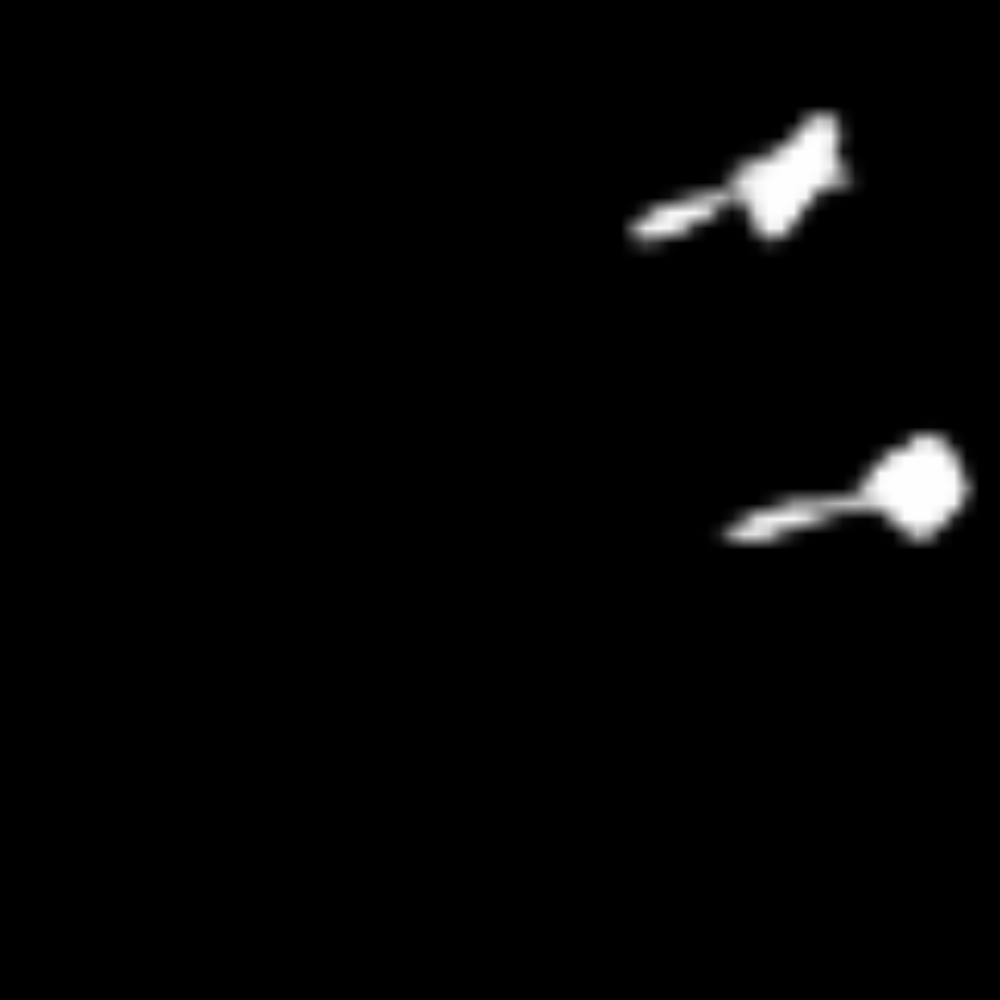

In [13]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

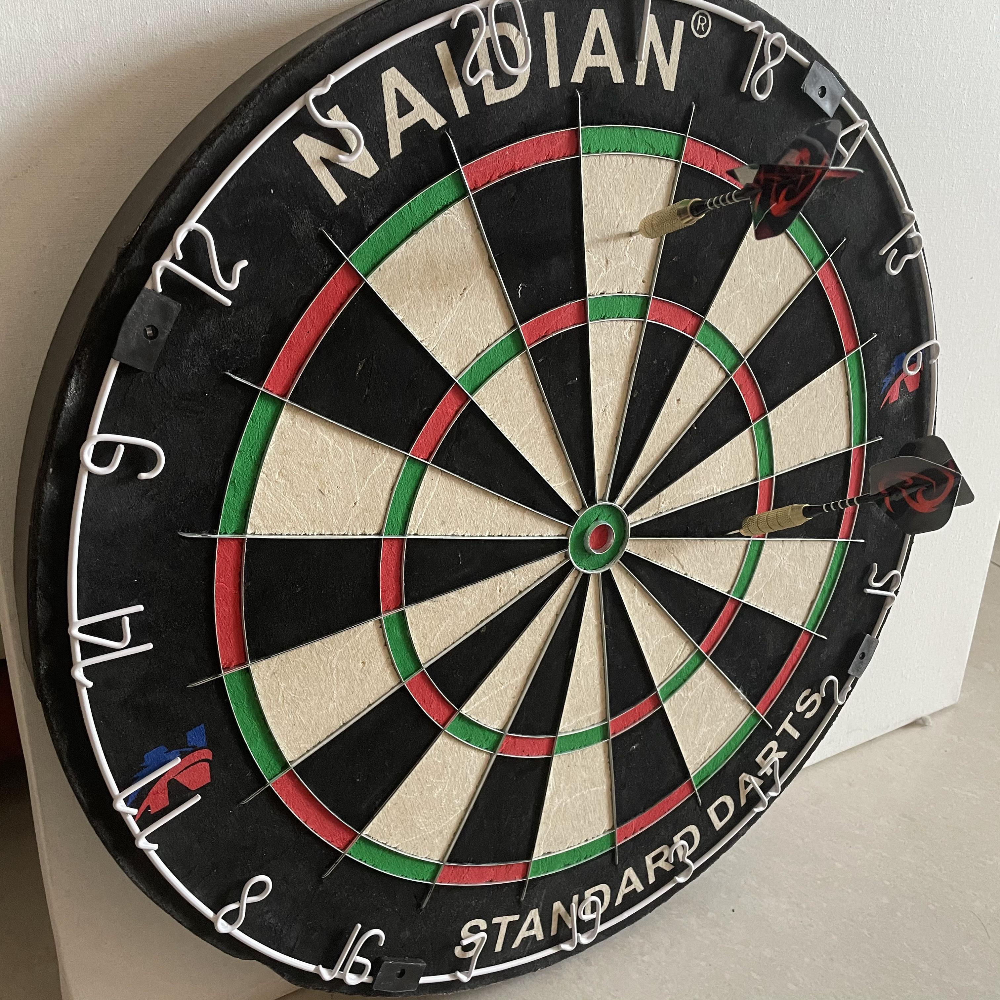

In [14]:
Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

In [24]:
prediction

[{'boxes': tensor([[1896.3647,  343.9791, 2940.8030, 1638.0229]]),
  'labels': tensor([1]),
  'scores': tensor([1.]),
  'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            ...,
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.]]]])}]